# 1. A first look at Taiwan Air Quality data by hours

## 1.1 Importing data and libs

In [1]:
#matplotlib inline
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

# Standard packages
import json

# Lib to create maps
import folium 
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

# Reading GeoJSON with Taiwan administrative borders
with open('Documents/county.geojson', encoding="utf-8") as file:
    district_borders = json.loads(file.read())

# To display stuff in notebook
from IPython.display import display, Markdown

#Read csv file
df = pd.read_csv('Documents/Taiwan_Air_Quality_Data_by_Hours.csv', low_memory=False)

## 1.2 Data preparation and importing data 

In [2]:
df.head()

,SiteName,County,AQI,Pollutant,Status,SO2,CO,O3,O3_8hr,PM10,...,WindDirec,DataCreationDate,Unit,CO_8hr,PM2.5_AVG,PM10_AVG,SO2_AVG,Longitude,Latitude,SiteId
0,基隆,基隆市,30.0,NaN,良好,1.1,0.22,37,35.0,14.0,...,79.0,2016-11-25 13:00,NaN,0.28,3.0,9,NaN,NaN,NaN,NaN
1,汐止,新北市,23.0,NaN,良好,0.7,0.26,28,27.0,21.0,...,41.0,2016-11-25 13:00,NaN,0.31,6.0,11,NaN,NaN,NaN,NaN
2,萬里,新北市,34.0,NaN,良好,1.2,0.2,42,40.0,31.0,...,65.0,2016-11-25 13:00,NaN,0.2,3.0,36,NaN,NaN,NaN,NaN
3,新店,新北市,29.0,NaN,良好,1.3,0.38,31,31.0,11.0,...,99.0,2016-11-25 13:00,NaN,0.36,9.0,6,NaN,NaN,NaN,NaN
4,土城,新北市,25.0,NaN,良好,1.6,0.38,30,29.0,28.0,...,154.0,2016-11-25 13:00,NaN,0.42,4.0,13,NaN,NaN,NaN,NaN


In [3]:
df.tail()

,SiteName,County,AQI,Pollutant,Status,SO2,CO,O3,O3_8hr,PM10,...,WindDirec,DataCreationDate,Unit,CO_8hr,PM2.5_AVG,PM10_AVG,SO2_AVG,Longitude,Latitude,SiteId
3517798,屏東(枋寮),屏東縣,126.0,細懸浮微粒,對敏感族群不健康,1.0,0.54,34.8,64,60,...,54,2021-12-31 19:00,NaN,0.5,45.0,63,1.0,120.590369,22.384742,313.0
3517799,基隆,基隆市,37.0,NaN,良好,1.5,0.21,39.3,40,19,...,86,2021-12-31 20:00,NaN,0.2,11.0,28,1.0,121.760056,25.129167,1.0
3517800,汐止,新北市,37.0,NaN,良好,2.0,0.26,29.5,34,17,...,25,2021-12-31 20:00,NaN,0.2,12.0,26,1.0,121.642300,25.067131,2.0
3517801,萬里,新北市,44.0,NaN,良好,0.5,0.17,48.4,48,32,...,55,2021-12-31 20:00,NaN,0.1,12.0,44,0.0,121.689881,25.179667,3.0
3517802,龍潭,桃園市,35.0,NaN,良好,1.3,0.21,36.6,38,11,...,38,2021-12-31 20:00,NaN,0.2,10.0,20,1.0,121.216350,24.863869,21.0


In [4]:
df.describe()

,AQI,SO2,NO2,NOx,NO,Unit,PM2.5_AVG,SO2_AVG,Longitude,Latitude,SiteId
count,3.478820e+06,3.430662e+06,3.408523e+06,3.405580e+06,3.405192e+06,0.0,3.462344e+06,2.929376e+06,2.604989e+06,2.604989e+06,1.819081e+06
mean,5.691617e+01,2.392665e+00,1.204513e+01,1.585746e+01,3.811408e+00,NaN,1.777821e+01,2.194460e+00,1.208333e+02,2.406168e+01,5.373173e+01
std,3.114143e+01,2.090307e+00,9.039715e+00,1.584270e+01,9.118370e+00,NaN,1.212031e+01,1.258580e+00,6.139191e-01,9.864816e-01,5.851711e+01
min,-1.000000e+00,-9.990000e+02,-2.778000e+01,-1.600000e+00,-7.200000e+00,NaN,-1.000000e+00,-1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,3.300000e+01,1.400000e+00,5.600000e+00,6.900000e+00,8.000000e-01,NaN,9.000000e+00,1.000000e+00,1.203455e+02,2.311510e+01,2.100000e+01
50%,4.900000e+01,2.000000e+00,9.800000e+00,1.180000e+01,1.500000e+00,NaN,1.500000e+01,2.000000e+00,1.207417e+02,2.415196e+01,4.200000e+01
75%,7.400000e+01,2.900000e+00,1.600000e+01,1.900000e+01,3.000000e+00,NaN,2.400000e+01,3.000000e+00,1.214519e+02,2.501700e+01,6.400000e+01
max,5.000000e+02,1.800000e+02,3.510500e+02,4.310000e+02,3.913100e+02,NaN,2.450000e+02,6.000000e+01,1.217929e+02,2.616047e+01,3.130000e+02


In [5]:
print("Column datatypes: ")

Column datatypes: 


In [6]:
print(df)

        SiteName County    AQI Pollutant    Status  SO2    CO    O3 O3_8hr  \
0             基隆    基隆市   30.0       NaN        良好  1.1  0.22    37   35.0   
1             汐止    新北市   23.0       NaN        良好  0.7  0.26    28   27.0   
2             萬里    新北市   34.0       NaN        良好  1.2   0.2    42   40.0   
3             新店    新北市   29.0       NaN        良好  1.3  0.38    31   31.0   
4             土城    新北市   25.0       NaN        良好  1.6  0.38    30   29.0   
...          ...    ...    ...       ...       ...  ...   ...   ...    ...   
3517798   屏東(枋寮)    屏東縣  126.0     細懸浮微粒  對敏感族群不健康  1.0  0.54  34.8     64   
3517799       基隆    基隆市   37.0       NaN        良好  1.5  0.21  39.3     40   
3517800       汐止    新北市   37.0       NaN        良好  2.0  0.26  29.5     34   
3517801       萬里    新北市   44.0       NaN        良好  0.5  0.17  48.4     48   
3517802       龍潭    桃園市   35.0       NaN        良好  1.3  0.21  36.6     38   

         PM10  ... WindDirec  DataCreationDate  Unit  CO_8hr PM

## 1.3 Convert Object to Float for data analyzing in Pandas

In [7]:
# check the data type and find which column is not suitable for data analyzing
df.dtypes

SiteName             object
County               object
AQI                 float64
Pollutant            object
Status               object
SO2                 float64
CO                   object
O3                   object
O3_8hr               object
PM10                 object
PM2.5                object
NO2                 float64
NOx                 float64
NO                  float64
WindSpeed            object
WindDirec            object
DataCreationDate     object
Unit                float64
CO_8hr               object
PM2.5_AVG           float64
PM10_AVG             object
SO2_AVG             float64
Longitude           float64
Latitude            float64
SiteId              float64
dtype: object

In [8]:
# choose those columns that change the object into float
cols_to_float = ['CO', 'O3', 'O3_8hr', 'PM10', 'PM2.5', 'WindSpeed', 'WindDirec', 'CO_8hr', 'PM10_AVG']

# fill non-convertible values with NaN
df[cols_to_float] = df[cols_to_float].apply(pd.to_numeric, errors='coerce')

# change the object into float inorder to analyze
df[cols_to_float] = df[cols_to_float].astype(float)

# change the 'DataCreationDate' from object into DateTime
df['DataCreationDate'] = pd.to_datetime(df['DataCreationDate'])

# check again
df.dtypes

SiteName                    object
County                      object
AQI                        float64
Pollutant                   object
Status                      object
SO2                        float64
CO                         float64
O3                         float64
O3_8hr                     float64
PM10                       float64
PM2.5                      float64
NO2                        float64
NOx                        float64
NO                         float64
WindSpeed                  float64
WindDirec                  float64
DataCreationDate    datetime64[ns]
Unit                       float64
CO_8hr                     float64
PM2.5_AVG                  float64
PM10_AVG                   float64
SO2_AVG                    float64
Longitude                  float64
Latitude                   float64
SiteId                     float64
dtype: object

## 1.4 Find is it any NaN in column

In [9]:
# Detect missing values.
df.isna().any()

SiteName            False
County              False
AQI                  True
Pollutant            True
Status               True
SO2                  True
CO                   True
O3                   True
O3_8hr               True
PM10                 True
PM2.5                True
NO2                  True
NOx                  True
NO                   True
WindSpeed            True
WindDirec            True
DataCreationDate    False
Unit                 True
CO_8hr               True
PM2.5_AVG            True
PM10_AVG             True
SO2_AVG              True
Longitude            True
Latitude             True
SiteId               True
dtype: bool

In [10]:
# Find is it any null in column and calculate the total numbers of each column.
df.isnull().sum()

SiteName                  0
County                    0
AQI                   38983
Pollutant           1824360
Status                 5958
SO2                   87141
CO                   112289
O3                   155157
O3_8hr               124667
PM10                 101616
PM2.5                155929
NO2                  109280
NOx                  112223
NO                   112611
WindSpeed            189650
WindDirec            189509
DataCreationDate          0
Unit                3517803
CO_8hr                83250
PM2.5_AVG             55459
PM10_AVG              71961
SO2_AVG              588427
Longitude            912814
Latitude             912814
SiteId              1698722
dtype: int64

In [11]:
df.isnull().mean()

SiteName            0.000000
County              0.000000
AQI                 0.011082
Pollutant           0.518608
Status              0.001694
SO2                 0.024771
CO                  0.031920
O3                  0.044106
O3_8hr              0.035439
PM10                0.028886
PM2.5               0.044326
NO2                 0.031065
NOx                 0.031901
NO                  0.032012
WindSpeed           0.053911
WindDirec           0.053871
DataCreationDate    0.000000
Unit                1.000000
CO_8hr              0.023665
PM2.5_AVG           0.015765
PM10_AVG            0.020456
SO2_AVG             0.167271
Longitude           0.259484
Latitude            0.259484
SiteId              0.482893
dtype: float64

## 1.5 Cleaning data 

In [12]:
# choose those columns to interpolate
columns_to_interpolate = ['AQI', 'SO2', 'CO', 'O3', 'O3_8hr', 'PM10', 'PM2.5', 'NO2', 'NOx', 'NO', 'WindSpeed', 'WindDirec', 'CO_8hr', 'PM2.5_AVG', 'PM10_AVG', 'SO2_AVG']

# use interpolate to impute missing value
df_data = df[columns_to_interpolate].interpolate()

# check the numbers of NaN
print(df_data.isnull().sum())

AQI               0
SO2               0
CO                0
O3                0
O3_8hr            0
PM10              0
PM2.5             0
NO2               0
NOx               0
NO                0
WindSpeed         0
WindDirec         0
CO_8hr            0
PM2.5_AVG         0
PM10_AVG          0
SO2_AVG      537768
dtype: int64


The number of missing values for SO2_AVG has not changed, so perhaps we should consider using another method to impute the missing values, such as statistical values like the mean or median.

## 1.6 Distribution of Status values in Taiwan

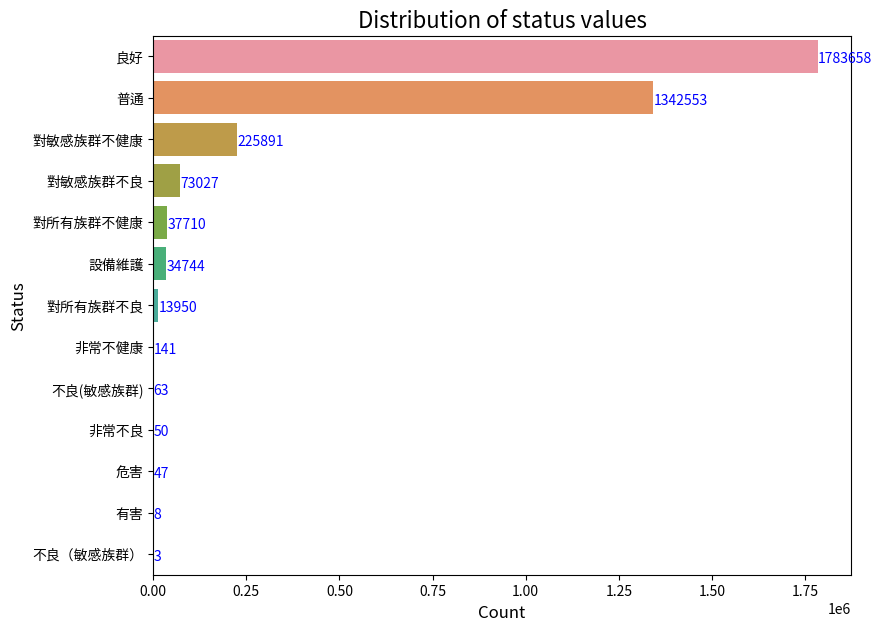

In [13]:
status_counts = df['Status'].value_counts()

# Set mandarin font
plt.rcParams['font.sans-serif'] = ['Taipei Sans TC Beta']

# Set figure size and title
plt.figure(figsize=(9,7))
plt.title('Distribution of status values', fontsize=16, fontweight='bold')

# Draw bar plot
sns.barplot(x = status_counts.values, y = status_counts.index)

# Indicate the number of each histogram
for i, v in enumerate(status_counts.values):
    plt.text(v + 3, i + .15, str(v), color='blue', fontweight='bold')

# Set label
plt.xlabel('Count', fontsize=12)
plt.ylabel('Status', fontsize=12)

# Show bar plot
plt.show()

## 1.7 Display each geographical coordinates of those site

In [14]:
site_filter = df[['SiteName', 'County', 'Longitude', 'Latitude', 'SiteId']].copy()

# Remove missing values.
site_filter = site_filter.dropna()

# Return DataFrame with duplicate rows removed
site_filter = site_filter.drop_duplicates(inplace=False)
site_filter.head()

,SiteName,County,Longitude,Latitude,SiteId
1698658,基隆,基隆市,121.760056,25.129167,1.0
1698659,汐止,新北市,121.642300,25.067131,2.0
1698660,萬里,新北市,121.689881,25.179667,3.0
1698661,新店,新北市,121.537778,24.977222,4.0
1698726,復興,高雄市,120.312017,22.608711,71.0


## 1.7 Plot Air Quality Monitoring Station's Site on map

In [15]:
#set map and the center is 臺灣地理中心碑
site_loc = folium.Map(location=[23.974046888716416, 120.97979604298477], tiles='cartodbpositron', zoom_start=8)

# Add points to the map
for idx, row in site_filter.iterrows():
    Marker([row['Latitude'], row['Longitude']], popup=row['SiteName']).add_to(site_loc)
            
# Adding borders
folium.GeoJson(
    district_borders,
    name='geojson'
).add_to(site_loc)

# Display the map
site_loc

# 2. Analysing the complete Daily Data on pollutants

## 2.1 Filter the dates and calculate the average on a daily basis

In [16]:
# Calculate the means of each column day by day
cleaned_df_data = df.copy()
daily_avg = cleaned_df_data.groupby(cleaned_df_data['DataCreationDate'].dt.date).mean().reset_index()

# Rename DataCreationDate to Date
col_map = {'DataCreationDate': 'Date'}
daily_avg = daily_avg.rename(columns=col_map)

# Check whether the specificed colums name has been successfully changed
daily_avg.head()

,Date,AQI,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,...,WindSpeed,WindDirec,Unit,CO_8hr,PM2.5_AVG,PM10_AVG,SO2_AVG,Longitude,Latitude,SiteId
0,2016-11-25,46.101675,2.818773,0.430841,36.267782,39.805179,41.316808,16.665354,16.060654,19.925303,...,2.822980,159.348611,NaN,0.460109,12.675837,33.088517,NaN,NaN,NaN,NaN
1,2016-11-26,52.270077,2.423315,0.430870,27.113356,33.737220,39.965232,17.288915,14.354335,18.819658,...,2.351568,161.790650,NaN,0.507100,15.911441,39.968097,NaN,NaN,NaN,NaN
2,2016-11-27,38.686608,1.855501,0.410151,20.977514,24.369427,21.127849,9.280876,13.340066,16.913079,...,3.375942,114.932638,NaN,0.450385,11.206367,28.708562,NaN,NaN,NaN,NaN
3,2016-11-28,49.581119,2.739353,0.403904,33.445877,33.412571,53.866619,22.639594,12.817808,16.768926,...,3.487216,115.880615,NaN,0.421035,15.651899,37.608357,NaN,NaN,NaN,NaN
4,2016-11-29,76.189502,3.123391,0.488798,32.663070,31.743824,59.886589,24.576782,17.698004,22.876770,...,2.750745,163.784637,NaN,0.483532,25.513369,63.177837,NaN,NaN,NaN,NaN


## 2.2 Visualising yearly AQI data

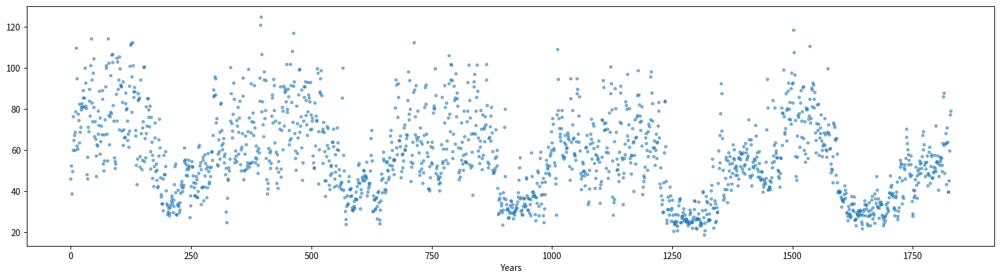

In [17]:
# Set the DataFrame index using the Date columns
AQI_data = daily_avg.copy()
AQI_data.set_index('Date')

# Visualising yearly data
axes = daily_avg['AQI'].plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 5), subplots=True)
for ax in axes:
    
    ax.set_xlabel('Years')
    ax.set_ylabel('')

## 2.3 Subsetting pollutants columns & Visualising yearly data

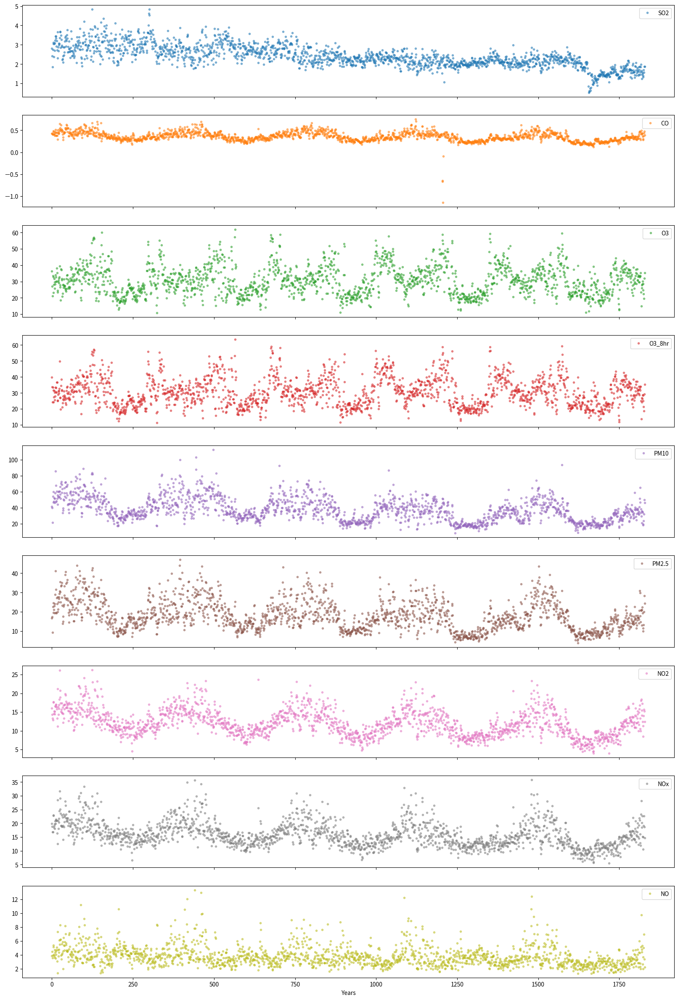

In [18]:
#Subsetting columns
pollutants = ['SO2','CO','O3','O3_8hr','PM10','PM2.5','NO2','NOx','NO']

#Visualising yearly data
axes = daily_avg[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 30), subplots=True)
for ax in axes:
    
    ax.set_xlabel('Years')
    ax.set_ylabel('')

## 2.4 Wide distribution in each pollutant along the six years time span (2016~2021)

In this step, we will further explore the seasonality of our data using box plots. We will group the data by different time periods and display the distribution of each pollutant using boxplots. Specifically, we will group the data by year and month.<br/>
<br/>First, let's create a function called "trend_plot" and demonstrate the trend plot of each pollutant

In [19]:
def trend_plot(dataframe, value):
    
    # Prepare data
    dataframe['year'] = [d.year for d in dataframe.Date]
    dataframe['month'] = [d.strftime('%b') for d in dataframe.Date]
    years = dataframe['year'].unique()

    # Draw Plot
    fig, axes = plt.subplots(1, 2, figsize=(14,6), dpi= 80)
    sns.boxplot(x='year', y=value, data=dataframe, ax=axes[0])
    sns.pointplot(x='month', y=value, data=dataframe.loc[~dataframe.year.isin([2016, 2021]), :])

    # Set Title
    axes[0].set_title('Yearly Box Plot \n(The Trend)', fontsize=18); 
    axes[1].set_title('Monthly Plot \n(The Seasonality)', fontsize=18)
    plt.show()

### 2.4.1 SO2

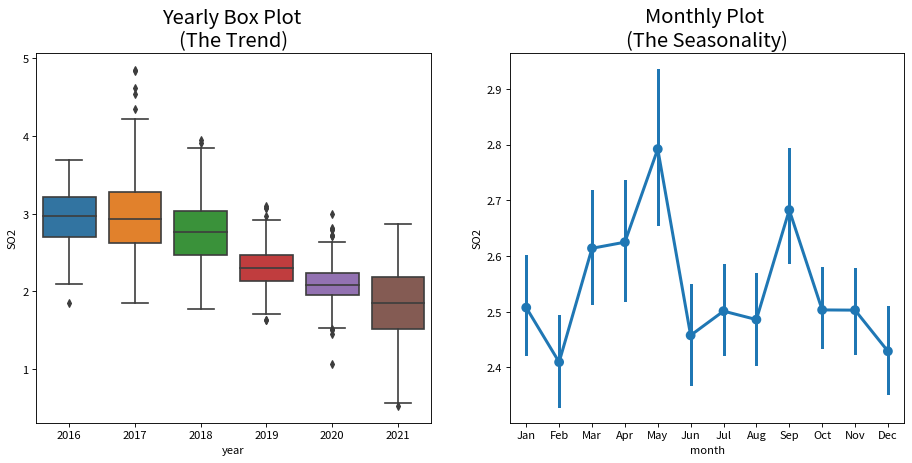

In [20]:
dataframe = daily_avg.copy()
value='SO2'
trend_plot(dataframe,value)

### 2.4.2 CO

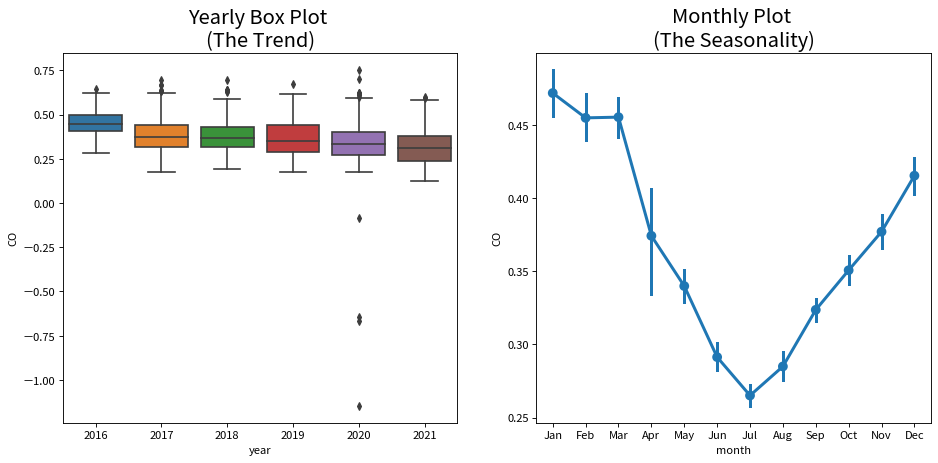

In [21]:
dataframe = daily_avg.copy()
value='CO'
trend_plot(dataframe,value)

### 2.4.3 O3

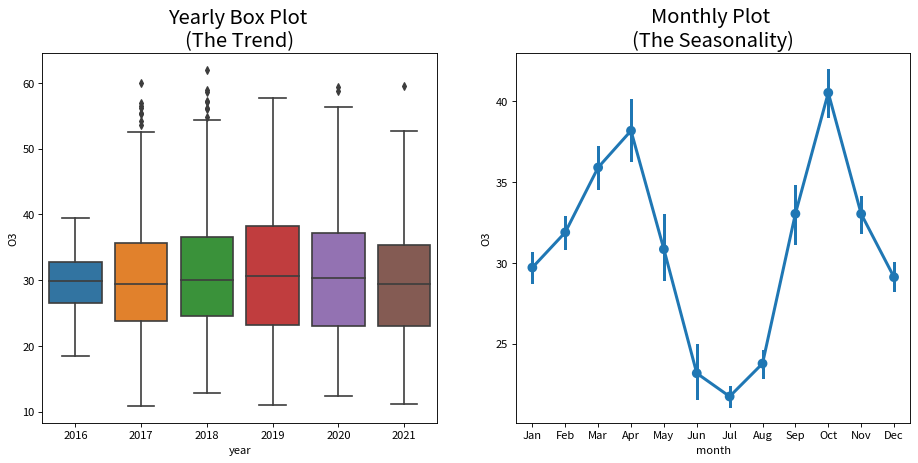

In [22]:
dataframe = daily_avg.copy()
value='O3'
trend_plot(dataframe,value)

### 2.4.4 O3_8hr

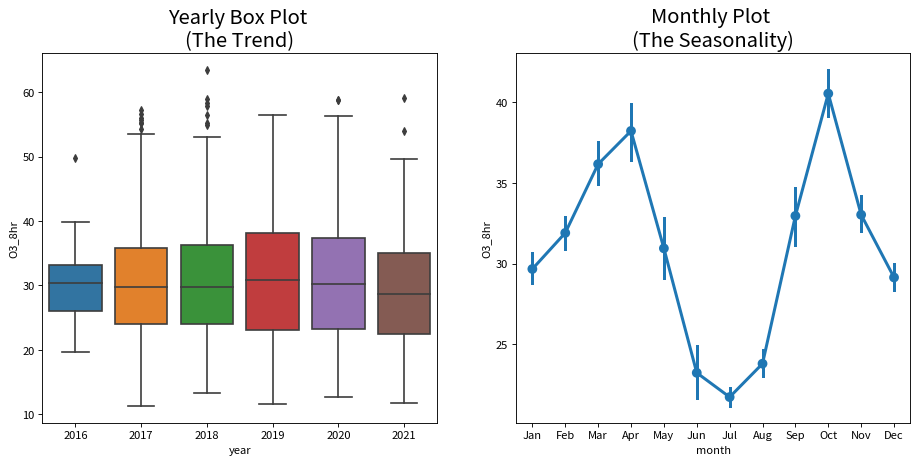

In [23]:
dataframe = daily_avg.copy()
value='O3_8hr'
trend_plot(dataframe,value)

### 2.4.5 PM10

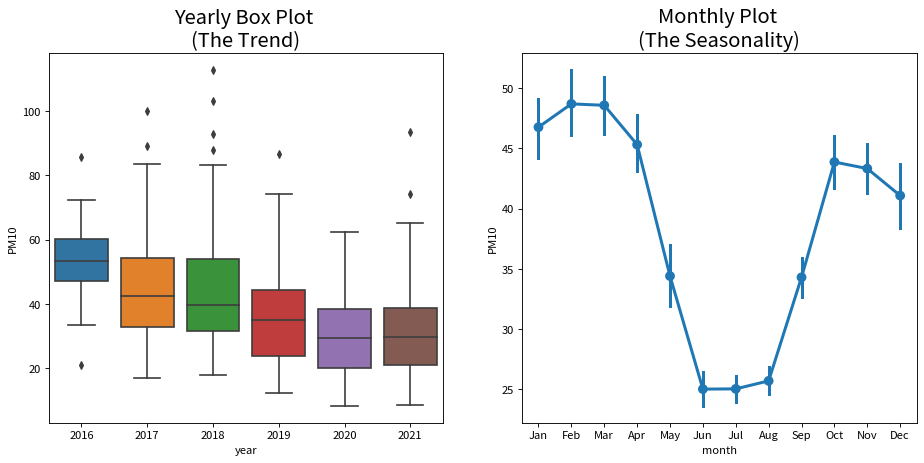

In [24]:
dataframe = daily_avg.copy()
value='PM10'
trend_plot(dataframe,value)

### 2.4.6 PM2.5

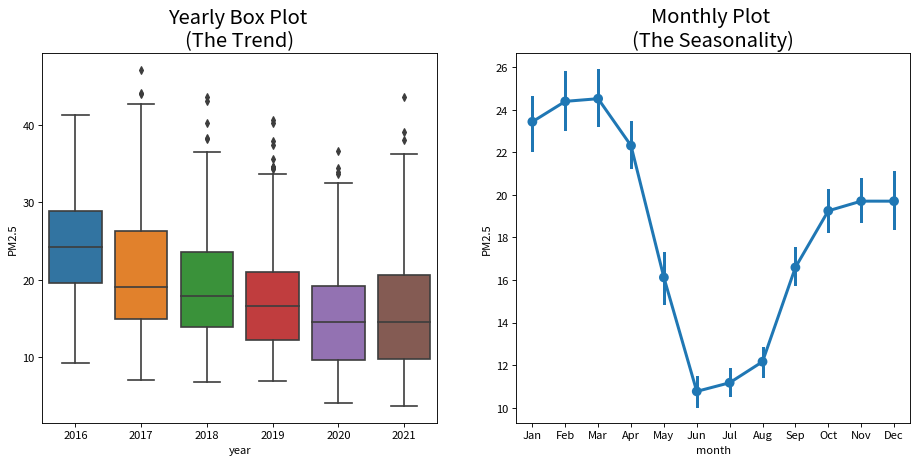

In [25]:
dataframe = daily_avg.copy()
value='PM2.5'
trend_plot(dataframe,value)

### 2.4.7 NO2

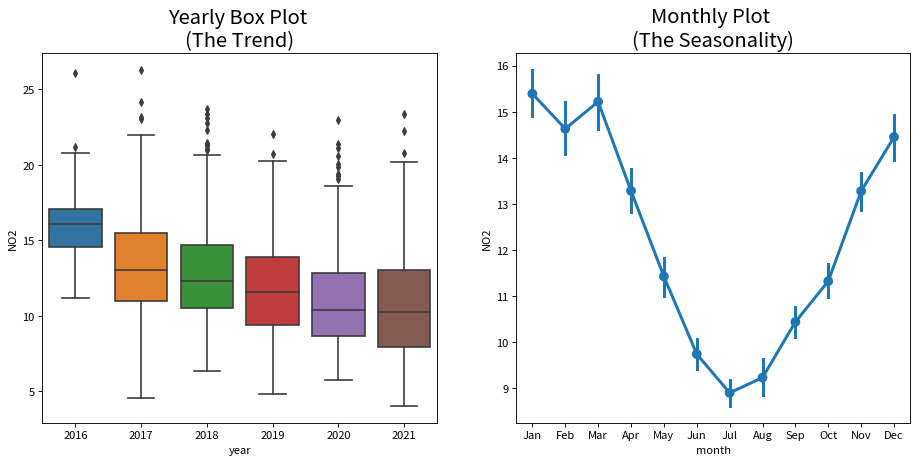

In [26]:
dataframe = daily_avg.copy()
value='NO2'
trend_plot(dataframe,value)

### 2.4.8 NOx

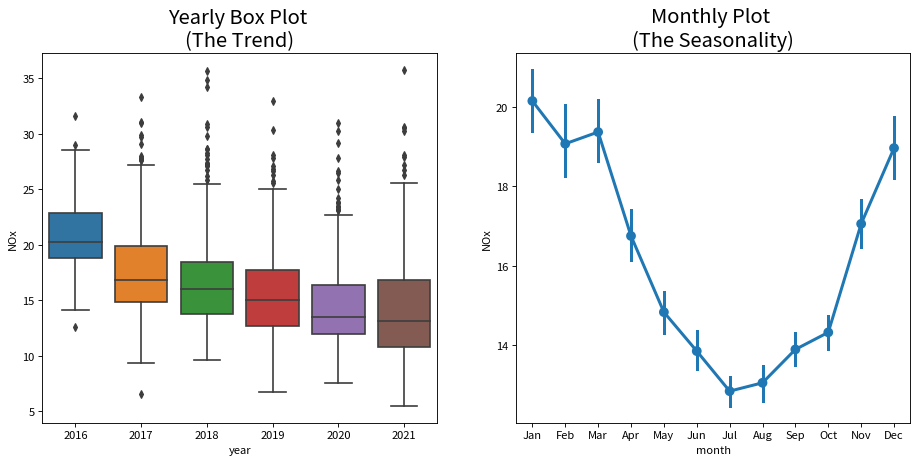

In [27]:
dataframe = daily_avg.copy()
value='NOx'
trend_plot(dataframe,value)

### 2.4.8 NO

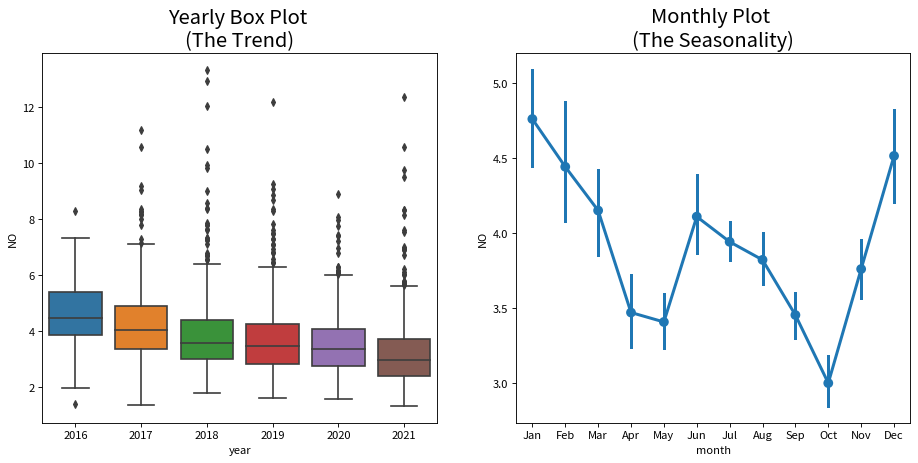

In [28]:
dataframe = daily_avg.copy()
value='NO'
trend_plot(dataframe,value)

# 3. Does pollutants have correlation?

## 3.1 Correlation between pollutants

In [29]:
air_data = cleaned_df_data.copy()
air_filter = air_data.loc[:, 'SO2':'NO']
air_filter.head()

,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,NO
0,1.1,0.22,37.0,35.0,14.0,4.0,3.0,4.7,1.7
1,0.7,0.26,28.0,27.0,21.0,5.0,11.0,15.0,4.0
2,1.2,0.20,42.0,40.0,31.0,2.0,2.7,4.3,1.6
3,1.3,0.38,31.0,31.0,11.0,16.0,12.0,16.0,4.7
4,1.6,0.38,30.0,29.0,28.0,4.0,11.0,16.0,4.6


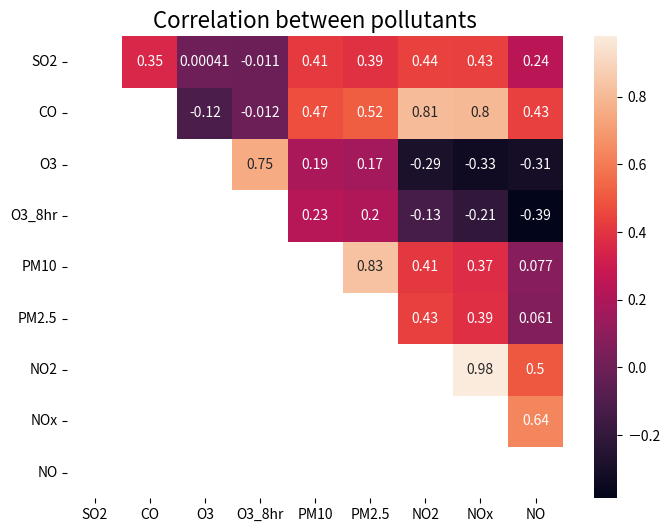

In [30]:
#Figure out the correlation between pollutant in 'air_filter'
air_data = cleaned_df_data.copy()
air_filter = air_data.loc[:, 'SO2':'NO']
air_filter.columns = list(map(lambda x: x.split()[0], air_filter.columns))
correlations = air_filter.corr(method='spearman')
mask = np.zeros_like(correlations)
mask[np.tril_indices_from(mask)] = True

plt.figure(figsize=(8,6))
ax = sns.heatmap(data=correlations, annot=True, mask=mask, color=sns.color_palette("coolwarm", 7))
plt.title('Correlation between pollutants', fontsize=16, fontweight='bold')
plt.xticks(rotation=0) 
plt.yticks(rotation=0) 
plt.show()

## 3.2 How pollutant concentrations varies with location?

In [31]:
county_pol = air_data.groupby(['County']).mean().loc[:, 'SO2':'NO']
county_pol

,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,NO
County,,,,,,,,,
南投縣,2.005633,0.341887,27.748922,27.722249,38.608213,21.797540,11.526752,13.791051,2.262448
嘉義市,2.822469,0.370668,27.878130,27.817493,47.295490,23.987194,13.114291,15.130101,2.014556
嘉義縣,2.416975,0.298786,31.116586,31.035298,51.424941,21.296601,8.962269,10.964062,1.999359
基隆市,1.896971,0.296805,31.975886,31.888277,25.330851,12.949250,9.419941,12.122498,2.693921
宜蘭縣,1.784160,0.261647,29.550106,29.441304,26.042174,10.924354,6.393167,8.309870,1.915233
屏東縣,1.988990,0.232491,34.353213,34.248399,39.141728,19.098165,7.918083,9.322899,1.399976
彰化縣,2.905510,0.308936,30.803071,30.739709,40.642660,18.966035,10.093845,11.917714,1.824535
新北市,2.160278,0.435633,31.045846,30.929713,30.530309,14.420704,14.289999,21.848713,7.558403
新竹市,2.055839,0.339372,31.069055,30.984286,31.784840,15.981791,12.307814,14.531043,2.221081


In [32]:
county_pol_norm = (county_pol - county_pol.mean()) / county_pol.std()
county_pol_norm

,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,NO
County,,,,,,,,,
南投縣,-0.449385,0.370390,-0.910325,-0.898104,0.294242,0.962911,0.427935,0.220632,-0.217674
嘉義市,1.178956,0.784471,-0.879251,-0.875149,1.241855,1.433946,0.873583,0.485615,-0.349342
嘉義縣,0.370614,-0.249710,-0.100406,-0.099636,1.692297,0.855150,-0.291956,-0.338798,-0.357414
基隆市,-0.666002,-0.278214,0.106255,0.105938,-1.154061,-0.940520,-0.163480,-0.109556,0.011502
宜蘭縣,-0.890888,-0.784043,-0.477143,-0.483800,-1.076469,-1.376112,-1.013144,-0.864034,-0.402097
屏東縣,-0.482563,-1.203508,0.677999,0.674743,0.352438,0.382225,-0.585075,-0.663566,-0.675775
彰化縣,1.344497,-0.103683,-0.175806,-0.170875,0.516160,0.353802,0.025695,-0.150081,-0.450271
新北市,-0.141105,1.719127,-0.117419,-0.125083,-0.586901,-0.623983,1.203623,1.815155,2.595266
新竹市,-0.349301,0.334201,-0.111837,-0.111930,-0.450056,-0.288164,0.647192,0.367068,-0.239646


In [33]:
county_pol_pol_norm = list(map(lambda x: x.split(' ')[0],county_pol_norm.columns))
county_pol_pol_norm

['SO2', 'CO', 'O3', 'O3_8hr', 'PM10', 'PM2.5', 'NO2', 'NOx', 'NO']

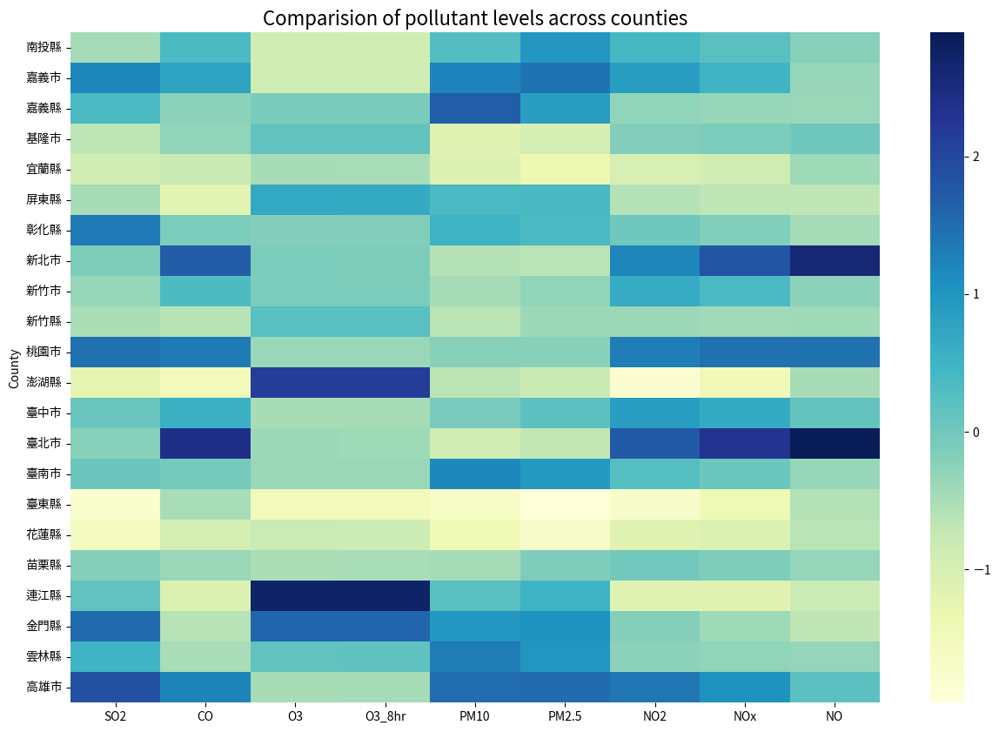

In [34]:
plt.figure(figsize=(15,10))

# Set mandarin font
plt.rcParams['font.sans-serif'] = ['Taipei Sans TC Beta']

# Set heatmap
sns.heatmap(data=county_pol_norm, cmap="YlGnBu")

# Set title
plt.title('Comparision of pollutant levels across counties', fontsize=16, fontweight='bold')
plt.xticks(rotation=0)
# Set the Chinese font to avoid displaying
plt.rcParams['font.sans-serif'] = ['Taipei Sans TC Beta']
plt.show()

* It is evident that the air quality in western Taiwan is poor.
* Conversely, the air quality in the east and north is better.
* The levels of NO and NO2 in municipalities are significantly higher, likely due to the large number of cars and locomotives in these areas.

# 4. Analysing the complete Daily Data on pollutants from city level

## 4.1 Group by county, date and calculate to daily level

Group by county, date and calculate to daily level

In [35]:
county_filter = air_data[['County','DataCreationDate','AQI', 'SO2','CO','O3','O3_8hr','PM10','PM2.5','NO2','NOx','NO']]
county_filter

,County,DataCreationDate,AQI,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,NO
0,基隆市,2016-11-25 13:00:00,30.0,1.1,0.22,37.0,35.0,14.0,4.0,3.0,4.7,1.7
1,新北市,2016-11-25 13:00:00,23.0,0.7,0.26,28.0,27.0,21.0,5.0,11.0,15.0,4.0
2,新北市,2016-11-25 13:00:00,34.0,1.2,0.20,42.0,40.0,31.0,2.0,2.7,4.3,1.6
3,新北市,2016-11-25 13:00:00,29.0,1.3,0.38,31.0,31.0,11.0,16.0,12.0,16.0,4.7
4,新北市,2016-11-25 13:00:00,25.0,1.6,0.38,30.0,29.0,28.0,4.0,11.0,16.0,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...
3517798,屏東縣,2021-12-31 19:00:00,126.0,1.0,0.54,34.8,64.0,60.0,45.0,21.9,22.2,0.3
3517799,基隆市,2021-12-31 20:00:00,37.0,1.5,0.21,39.3,40.0,19.0,10.0,5.4,6.1,0.6
3517800,新北市,2021-12-31 20:00:00,37.0,2.0,0.26,29.5,34.0,17.0,7.0,13.5,15.0,1.5
3517801,新北市,2021-12-31 20:00:00,44.0,0.5,0.17,48.4,48.0,32.0,11.0,2.0,2.9,0.9


In [36]:
##filter “DataCreationDate” and “County” and get the means
county_daily_avg = county_filter.groupby([county_filter['County'], county_filter['DataCreationDate'].dt.to_period(freq = 'D')]).mean()
county_daily_avg = county_daily_avg.reset_index()
county_daily_avg

,County,DataCreationDate,AQI,SO2,CO,O3,O3_8hr,PM10,PM2.5,NO2,NOx,NO
0,南投縣,2016-11-25,63.333333,2.615152,0.474242,38.560606,44.484848,60.242424,31.606061,16.333333,18.448485,2.066667
1,南投縣,2016-11-26,83.958333,1.956944,0.401667,18.683333,27.352941,46.625000,25.180556,13.630556,16.594444,2.936111
2,南投縣,2016-11-27,46.833333,1.556944,0.355694,15.316667,20.254902,19.986111,8.794118,13.552778,15.720833,2.125000
3,南投縣,2016-11-28,37.350877,2.392982,0.428246,22.314035,21.666667,35.263158,16.245614,13.015789,15.796491,2.843860
4,南投縣,2016-11-29,73.292683,2.993023,0.540952,27.137209,24.585366,54.953488,28.055556,18.844186,21.906977,3.102326
...,...,...,...,...,...,...,...,...,...,...,...,...
40079,高雄市,2021-12-27,54.668269,2.210194,0.416456,11.567647,11.399038,30.545894,18.024390,18.209314,24.171078,5.925490
40080,高雄市,2021-12-28,76.568562,2.213514,0.480067,17.216726,13.891986,42.962963,25.959459,22.002034,29.116271,7.075593
40081,高雄市,2021-12-29,91.157051,2.027010,0.464630,23.879470,22.726384,50.637255,32.581169,20.129316,24.024430,3.857329
40082,高雄市,2021-12-30,111.551282,2.472347,0.576515,22.768106,21.288462,68.537459,42.190164,24.299346,29.695752,5.357516


## 4.2 Most Polluted County in Taiwan

## 4.2.1 Distribution of status values

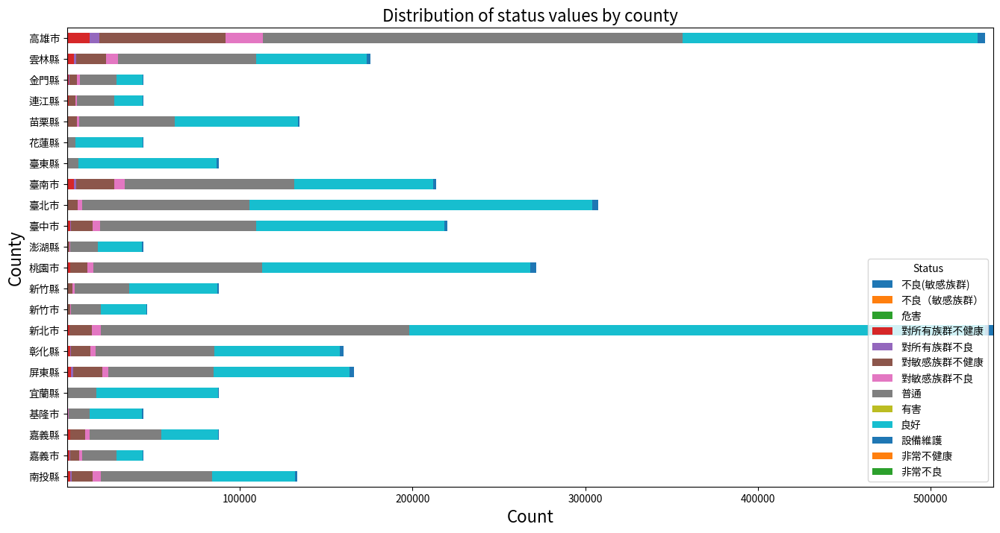

In [37]:
# Create a pivot table to calculate the count of each status for each county
county_status_counts = df.pivot_table(index='County', columns='Status', aggfunc='size', fill_value=0)

# Plot the stacked bar chart
county_status_counts.plot.barh(figsize=(16, 8), stacked=True)
plt.title('Distribution of status values by county', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=16)
plt.ylabel('County', fontsize=16)

# Add legend
plt.legend(title='Status')

# Show the chart
plt.show()


## 4.2.2 Top 10 AQI base on County and Date

In [38]:
#Filter AQI of all county in Taiwan
county_AQI = county_daily_avg[['County', 'DataCreationDate', 'AQI']]

# Rename DataCreationDate to Date
col_map = {'DataCreationDate': 'Date'}
county_AQI = county_AQI.rename(columns=col_map)

# # Sorting the first 10 AQI from county level
county_AQI.sort_values('AQI', ascending=False).head(10)

,County,Date,AQI
33317,連江縣,2018-04-26,175.791667
36940,雲林縣,2018-04-07,174.324675
34717,金門縣,2017-03-01,173.000000
2532,嘉義市,2018-11-07,166.708333
35422,金門縣,2019-02-05,166.250000
20725,澎湖縣,2018-10-06,165.500000
35799,金門縣,2020-03-19,165.208333
38685,高雄市,2018-01-21,165.055556
34763,金門縣,2017-04-16,161.764706
35423,金門縣,2019-02-06,161.666667


## 4.2.3 Top 10 AQI base on municipality and Date

In [39]:
#select AQI of 6 main cities in Taiwan
municipality = ['臺北市','新北市','桃園市','臺中市','臺南市','高雄市']
municipality_daily_avg = county_daily_avg[county_daily_avg['County'].isin(municipality)]
municipality_AQI = municipality_daily_avg[['County', 'DataCreationDate', 'AQI']]

# Rename DataCreationDate to Date
col_map = {'DataCreationDate': 'Date'}
municipality_AQI = municipality_AQI.rename(columns=col_map)
municipality_AQI

,County,Date,AQI
12754,新北市,2016-11-25,28.537190
12755,新北市,2016-11-26,32.511364
12756,新北市,2016-11-27,32.167300
12757,新北市,2016-11-28,56.722772
12758,新北市,2016-11-29,56.763636
...,...,...,...
40079,高雄市,2021-12-27,54.668269
40080,高雄市,2021-12-28,76.568562
40081,高雄市,2021-12-29,91.157051
40082,高雄市,2021-12-30,111.551282


In [40]:
# Sorting the AQI from municipality level
municipality_AQI.sort_values('AQI', ascending=False).head(10)

,County,Date,AQI
38685,高雄市,2018-01-21,165.055556
27011,臺南市,2021-02-07,155.900000
25931,臺南市,2018-01-21,155.729167
39754,高雄市,2021-01-27,153.685606
38705,高雄市,2018-02-10,153.579861
26994,臺南市,2021-01-21,153.166667
38682,高雄市,2018-01-18,152.673611
38275,高雄市,2016-12-07,152.491039
38665,高雄市,2018-01-01,152.149306
39749,高雄市,2021-01-22,151.678030


## 4.2.4 Draw trend plot of  municipality

In [41]:
municipality_AQI_pivot = municipality_AQI.pivot(index='Date', columns='County', values='AQI')
print(municipality_AQI_pivot.head())

County            新北市        桃園市        臺中市        臺北市         臺南市         高雄市
Date                                                                          
2016-11-25  28.537190  26.833333  39.018182  27.623377   51.818182   86.810606
2016-11-26  32.511364  33.743056  68.116667  31.077381   62.156250   82.134752
2016-11-27  32.167300  31.812500  38.225000  29.351190   42.614583   56.344948
2016-11-28  56.722772  53.842105  43.776596  54.939850   46.921053   46.625000
2016-11-29  56.763636  59.900000  80.186667  61.355769  110.100000  107.350000


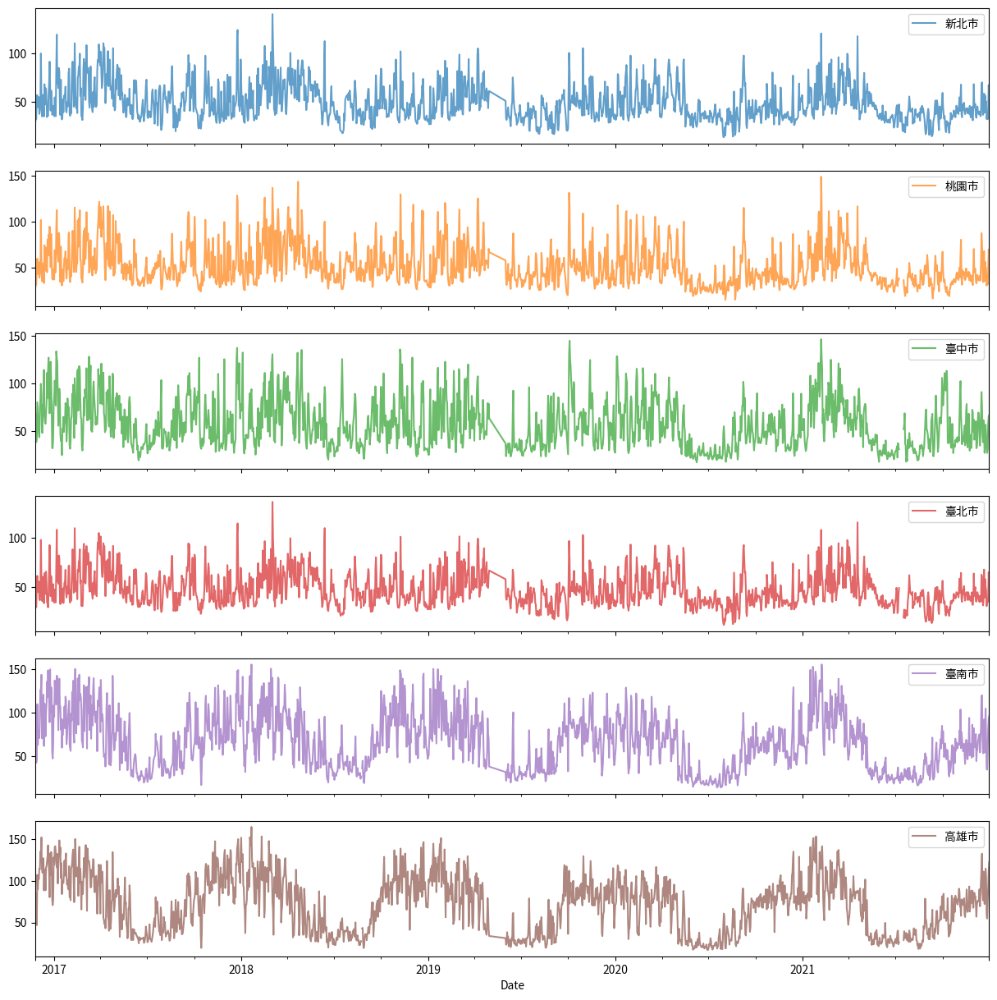

In [42]:
municipality_AQI_pivot.plot(alpha=0.7, subplots=True, figsize=(15, 15));